# **Credit EDA & Credit Score Calculation with Python**

**Problem statement:**
To conduct a thorough exploratory data analysis (EDA) and deep analysis of a comprehensive dataset containing basic customer details and extensive credit-related information. The aim is to create new, informative features, calculate a hypothetical credit score, and uncover meaningful patterns, anomalies, and insights within the data.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [ ]:
!pip install pandas_profiling

In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
!gdown 1pljm6_3nxcFS9UMIFm124HBsjNZP6ACA

Downloading...
From: https://drive.google.com/uc?id=1pljm6_3nxcFS9UMIFm124HBsjNZP6ACA
To: /content/Credit_score.csv
100% 27.4M/27.4M [00:00<00:00, 68.3MB/s]


In [ ]:
df=pd.read_csv('/content/Credit_score.csv')

Downloading the dataset

In [ ]:
df.shape

(100000, 27)

Dataset contains 100000 rows and 27 columns

In [ ]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231


First five rows of the dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 27 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [ ]:
df.duplicated().sum()

0


The dataset contains no duplicate values.

In [ ]:
df.isnull().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,9985
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,15002
Num_Bank_Accounts,0


Columns Name, Monthly Inhand Salary, Type of loan, Num of delayed payment, Num credit Inquiries, Credit History Age, Amount invested monthly and Monthly balance contains null values

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df['Month']=df['Month'].astype('category')
df['Name']=df['Name'].astype('category')
df['Credit_Mix']=df['Credit_Mix'].astype('category')
df['Payment_of_Min_Amount']=df['Payment_of_Min_Amount'].astype('category')
df['Occupation']=df['Occupation'].astype('category')

Columns like Month, Name, Credit Mix, Payment of min amount and occupation are converted to category datatype

## Data Cleaning

In [ ]:
df['Age'].unique()

array(['23', '-500', '28_', ..., '4808_', '2263', '1342'], dtype=object)

In [ ]:
df['Annual_Income'].unique()

array(['19114.12', '34847.84', '34847.84_', ..., '20002.88', '39628.99',
       '39628.99_'], dtype=object)

In [ ]:
df['Num_of_Loan'].unique()

array(['4', '1', '3', '967', '-100', '0', '0_', '2', '3_', '2_', '7', '5',
       '5_', '6', '8', '8_', '9', '9_', '4_', '7_', '1_', '1464', '6_',
       '622', '352', '472', '1017', '945', '146', '563', '341', '444',
       '720', '1485', '49', '737', '1106', '466', '728', '313', '843',
       '597_', '617', '119', '663', '640', '92_', '1019', '501', '1302',
       '39', '716', '848', '931', '1214', '186', '424', '1001', '1110',
       '1152', '457', '1433', '1187', '52', '1480', '1047', '1035',
       '1347_', '33', '193', '699', '329', '1451', '484', '132', '649',
       '995', '545', '684', '1135', '1094', '1204', '654', '58', '348',
       '614', '1363', '323', '1406', '1348', '430', '153', '1461', '905',
       '1312', '1424', '1154', '95', '1353', '1228', '819', '1006', '795',
       '359', '1209', '590', '696', '1185_', '1465', '911', '1181', '70',
       '816', '1369', '143', '1416', '455', '55', '1096', '1474', '420',
       '1131', '904', '89', '1259', '527', '1241', '449', 

In [ ]:
df['Num_of_Delayed_Payment'].unique()

array(['7', nan, '4', '8_', '6', '1', '-1', '3_', '0', '8', '5', '3', '9',
       '12', '15', '17', '10', '2', '2_', '11', '14', '20', '22', '13',
       '13_', '14_', '16', '12_', '18', '19', '23', '24', '21', '3318',
       '3083', '22_', '1338', '4_', '26', '11_', '3104', '21_', '25',
       '10_', '183_', '9_', '1106', '834', '19_', '24_', '17_', '23_',
       '2672', '20_', '2008', '-3', '538', '6_', '1_', '16_', '27', '-2',
       '3478', '2420', '15_', '707', '708', '26_', '18_', '3815', '28',
       '5_', '1867', '2250', '1463', '25_', '7_', '4126', '2882', '1941',
       '2655', '2628', '132', '3069', '306', '0_', '3539', '3684', '1823',
       '4128', '1946', '827', '2297', '2566', '904', '182', '929', '3568',
       '2503', '1552', '2812', '1697', '3764', '851', '3905', '923', '88',
       '1668', '3253', '808', '2689', '3858', '642', '3457', '1402',
       '1732', '3154', '847', '3037', '2204', '3103', '1063', '2056',
       '1282', '1841', '2569_', '211', '793', '3484', '4

In [ ]:
df['Changed_Credit_Limit'].unique()

array(['11.27', '_', '6.27', ..., '27.38', '25.16', '21.17'], dtype=object)

In [ ]:
df['Outstanding_Debt'].unique()

array(['809.98', '605.03', '1303.01', ..., '3571.7_', '3571.7', '502.38'],
      dtype=object)

In [ ]:
df['Amount_invested_monthly'].unique()

array(['80.41529544', '118.2802216', '81.69952126', ..., '24.02847745',
       '251.6725822', '167.1638652'], dtype=object)

In [ ]:
df['Monthly_Balance'].unique()

array(['312.4940887', '284.6291625', '331.2098629', ..., 516.8090833,
       319.1649785, 393.6736956], dtype=object)

In [ ]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance'],
      dtype='object')

In [ ]:
def remove_underscore(value):
      # Check if the value is a string
    if isinstance(value, str):
        # Remove underscores from the string and return the modified value
        return value.replace('_', '') if value != 'nan' else float('nan')
    else:
        # If it's already a float or NaN, return it as is
        return value


def modify_data(columns):
    for each_column in columns:
        # Apply the remove_underscore function to the column and convert 'nan' strings to NaN
        df[each_column] = df[each_column].apply(remove_underscore)

        # Convert valid numeric strings to float and handle conversion errors
        df[each_column] = pd.to_numeric(df[each_column], errors='coerce')

# Specify columns to modify
columns_to_modify = ['Age', 'Annual_Income','Num_of_Loan','Num_of_Delayed_Payment','Changed_Credit_Limit','Outstanding_Debt',
                     'Amount_invested_monthly','Monthly_Balance']
modify_data(columns_to_modify)


Removed "_" and converted some columns to float

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 27 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   ID                        100000 non-null  object  
 1   Customer_ID               100000 non-null  object  
 2   Month                     100000 non-null  category
 3   Name                      90015 non-null   category
 4   Age                       100000 non-null  int64   
 5   SSN                       100000 non-null  object  
 6   Occupation                100000 non-null  category
 7   Annual_Income             100000 non-null  float64 
 8   Monthly_Inhand_Salary     84998 non-null   float64 
 9   Num_Bank_Accounts         100000 non-null  int64   
 10  Num_Credit_Card           100000 non-null  int64   
 11  Interest_Rate             100000 non-null  int64   
 12  Num_of_Loan               100000 non-null  int64   
 13  Type_of_Loan              8859

In [ ]:
df.isnull().sum().sort_values(ascending=False).to_frame('Missing_Values')

,Missing_Values
Monthly_Inhand_Salary,15002
Type_of_Loan,11408
Name,9985
Credit_History_Age,9030
Num_of_Delayed_Payment,7002
Amount_invested_monthly,4479
Changed_Credit_Limit,2091
Num_Credit_Inquiries,1965
Monthly_Balance,1200
Num_Bank_Accounts,0


In [ ]:
df.describe(include='number').T

,count,mean,std,min,25%,50%,75%,max
Age,100000.0,1.106497e+02,6.862447e+02,-5.000000e+02,24.000000,33.000000,42.000000,8.698000e+03
Annual_Income,100000.0,1.764157e+05,1.429618e+06,7.005930e+03,19457.500000,37578.610000,72790.920000,2.419806e+07
Monthly_Inhand_Salary,84998.0,4.194171e+03,3.183686e+03,3.036454e+02,1625.568229,3093.745000,5957.448333,1.520463e+04
Num_Bank_Accounts,100000.0,1.709128e+01,1.174048e+02,-1.000000e+00,3.000000,6.000000,7.000000,1.798000e+03
Num_Credit_Card,100000.0,2.247443e+01,1.290574e+02,0.000000e+00,4.000000,5.000000,7.000000,1.499000e+03
Interest_Rate,100000.0,7.246604e+01,4.664226e+02,1.000000e+00,8.000000,13.000000,20.000000,5.797000e+03
Num_of_Loan,100000.0,3.009960e+00,6.264788e+01,-1.000000e+02,1.000000,3.000000,5.000000,1.496000e+03
Delay_from_due_date,100000.0,2.106878e+01,1.486010e+01,-5.000000e+00,10.000000,18.000000,28.000000,6.700000e+01
Num_of_Delayed_Payment,92998.0,3.092334e+01,2.260319e+02,-3.000000e+00,9.000000,14.000000,18.000000,4.397000e+03
Changed_Credit_Limit,97909.0,1.038903e+01,6.789496e+00,-6.490000e+00,5.320000,9.400000,14.870000,3.697000e+01


**Insights:**

**Age Distribution:**
The average age is unexpectedly high (110.65), and the standard deviation (686.24) is unusually large, indicating possible outliers or data entry errors (e.g., negative values and a maximum of 8,698 years).
Minimum age is -500, which is unrealistic, suggesting data quality issues.

**Annual Income:**
The mean annual income is 176,415.70 USD, but the high standard deviation (1.42 million) indicates significant variability in income levels, with a maximum of over 24 million USD.
The 25th percentile shows 19,457 USD, and the median is around $37,578, suggesting a skewed income distribution.

**Monthly In-hand Salary:**
The average in-hand salary is 5,743.26 USD, but the standard  deviation of 45,814.69 USD shows a large variation.
The max value of nearly $2 million is unusually high, indicating possible outliers.

**Number of Bank Accounts:**
The average number of bank accounts is 17.09, with a standard deviation of 117.40. This large variation suggests the presence of extreme values (max 1,798 accounts).
The minimum value is -1, which points to incorrect data entries.

**Number of Credit Cards:**
The average number of credit cards is 22.47, with a wide range (maximum of 1,499).
The absence of negative values, but significant variability, may suggest outliers or misreporting.

**Interest Rate:**
The mean interest rate is 72.47%, with a very high standard deviation (466.42%), indicating large discrepancies in interest rates.
The max value is 5,797%, suggesting potential data entry errors.

**Number of Loans:**
The average number of loans is 3.01, but with a minimum of -100 and a maximum of 1,496, this highlights potential outliers or incorrect data entries.

**Delayed Payments:**
The average number of delayed payments is 29.74, with significant variability (standard deviation of 218). The maximum of 4,397 delayed payments suggests the presence of extreme cases.

**Changed Credit Limit:**
On average, the credit limit was changed by 10.39 units, with the maximum change being 36.97. Negative values (minimum -6.49) could indicate reductions in credit limits.

**Credit Inquiries:**
The average number of credit inquiries is 27.33, with a maximum of 2,597. The high standard deviation suggests that some individuals have a significantly higher number of inquiries.

**Outstanding Debt:**
The mean outstanding debt is 1,426.22 USD, with a fairly high standard deviation ($1,155.13). The debt range (from 0.23 to $4,998) indicates a wide variety of debt loads.

**Credit Utilization Ratio:**
The average credit utilization ratio is 32.29%, which falls within the typical 30-40% range for responsible credit usage.

**Total EMI per Month:**
The average EMI per month is 1,403.12 USD, with a maximum of $82,331, suggesting significant variation in the amount of debt repayments.

**Monthly Balance:**
The extreme negative mean value (-3e+22) and large variation (max 1.6k, min -3.33e+26) indicate major issues with the data quality in this column.

In [ ]:
df.describe(include='object').T

,count,unique,top,freq
ID,100000,100000,0x1602,1
Customer_ID,100000,12500,CUS_0xd40,8
SSN,100000,12501,#F%$D@*&8,5572
Type_of_Loan,88592,6260,Not Specified,1408
Credit_History_Age,90970,404,15 Years and 11 Months,446
Payment_Behaviour,100000,7,Low_spent_Small_value_payments,25513


In [ ]:
df.describe(include='category').T

,count,unique,top,freq
Month,100000,8,April,12500
Name,90015,10139,Langep,44
Occupation,100000,16,_______,7062
Credit_Mix,100000,4,Standard,36479
Payment_of_Min_Amount,100000,3,Yes,52326


In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
df.head(3)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629163
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,NaN,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863


In [ ]:
df.duplicated().sum()

0

In [ ]:
correlation_matrix=df.select_dtypes(include='number').corr()

In [ ]:
correlation_matrix

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Age,1.000000,-0.000533,0.003029,0.002466,-0.001791,-0.005667,-0.001273,-0.009681,-0.002545,-0.003048,-0.002022,-0.001995,0.002774,0.000662,0.003797,0.001052
Annual_Income,-0.000533,1.000000,0.030519,-0.004627,0.001250,-0.002908,0.001464,-0.010631,0.001180,0.000615,0.003153,-0.003706,0.010316,-0.000248,-0.005318,0.000818
Monthly_Inhand_Salary,0.003029,0.030519,1.000000,-0.010819,-0.005049,-0.006422,-0.010398,-0.250100,0.000917,-0.174933,-0.008867,-0.269727,0.173192,0.007264,0.061485,-0.000806
Num_Bank_Accounts,0.002466,-0.004627,-0.010819,1.000000,-0.002216,-0.003998,-0.000679,0.015966,-0.003619,0.008010,-0.001683,0.015548,-0.001365,-0.001433,0.003233,0.001065
Num_Credit_Card,-0.001791,0.001250,-0.005049,-0.002216,1.000000,-0.004012,0.001421,0.008715,0.004876,0.005599,-0.003479,0.005626,-0.003341,0.000768,-0.002072,0.001276
Interest_Rate,-0.005667,-0.002908,-0.006422,-0.003998,-0.004012,1.000000,0.000614,0.009792,0.002669,0.000887,-0.001681,0.010721,-0.000359,0.002517,-0.001203,0.001256
Num_of_Loan,-0.001273,0.001464,-0.010398,-0.000679,0.001421,0.000614,1.000000,0.012625,0.010218,0.015865,-0.000497,0.023772,-0.003967,0.001554,-0.000861,-0.000033
Delay_from_due_date,-0.009681,-0.010631,-0.250100,0.015966,0.008715,0.009792,0.012625,1.000000,0.012657,0.293697,0.011508,0.571713,-0.063796,-0.003889,-0.012557,0.004454
Num_of_Delayed_Payment,-0.002545,0.001180,0.000917,-0.003619,0.004876,0.002669,0.010218,0.012657,1.000000,0.007136,0.002837,0.010121,0.000866,0.001120,0.001280,0.000931
Changed_Credit_Limit,-0.003048,0.000615,-0.174933,0.008010,0.005599,0.000887,0.015865,0.293697,0.007136,1.000000,0.006562,0.458549,-0.048862,-0.001840,-0.011704,-0.002182


In [ ]:
categorical_columns = df.select_dtypes(include='category').columns
object_columns = df.select_dtypes(include='object').columns

In [ ]:
categorical_columns

Index(['Month', 'Name', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount'], dtype='object')

In [ ]:
object_columns

Index(['ID', 'Customer_ID', 'SSN', 'Type_of_Loan', 'Credit_History_Age',
       'Payment_Behaviour'],
      dtype='object')

In [ ]:
df['Occupation']=df['Occupation'].replace('_______','Other')

Null values in Occupation is replaced by other

In [ ]:
df['Occupation'].value_counts()

,count
Occupation,
Other,7062
Lawyer,6575
Architect,6355
Engineer,6350
Scientist,6299
Mechanic,6291
Accountant,6271
Developer,6235
Media_Manager,6232


In [ ]:
df['Credit_Mix'].value_counts()

,count
Credit_Mix,
Standard,36479
Good,24337
_,20195
Bad,18989


In [ ]:
df['Credit_Mix']=df['Credit_Mix'].replace('_','Unknown')

Null values in Credit Mix is replaced by Unknown

In [ ]:
df.isnull().sum().sort_values(ascending=False).to_frame('Missing_Values')

,Missing_Values
Monthly_Inhand_Salary,15002
Type_of_Loan,11408
Name,9985
Credit_History_Age,9030
Num_of_Delayed_Payment,7002
Amount_invested_monthly,4479
Changed_Credit_Limit,2091
Num_Credit_Inquiries,1965
Monthly_Balance,1200
Num_Bank_Accounts,0


In [ ]:
df['Monthly_Inhand_Salary'].mean()

4194.170849592996

In [ ]:
df['Monthly_Inhand_Salary']=df['Monthly_Inhand_Salary'].fillna(df['Annual_Income']/12)

Null values in Monthly Inhand Salary is replaaced by Annual_Income column

In [ ]:
df['Monthly_Inhand_Salary'].isnull().sum()

0

In [ ]:
df['Type_of_Loan']=df['Type_of_Loan'].astype('object')

In [ ]:
df['Type_of_Loan']=df['Type_of_Loan'].fillna('Unknown')

Null values in Type of loan column is replaced by Unknown

In [ ]:
df['Type_of_Loan'].isnull().sum()

0

In [ ]:
df["Name"]=df["Name"].astype('object')
df["Name"]=df["Name"].fillna("Unknown")

Null values in Name column is replaced by Unknown

In [ ]:
df["Name"].isnull().sum()

0

In [ ]:
df['Credit_History_Age']=df['Credit_History_Age'].fillna("Unknown")

Null values in Credit_History_Age column is replaced by Unknown

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
67284,0x1a03e,CUS_0x6d63,May,Mattx,29,609-98-6953,Lawyer,8393.96,780.496667,5,5,32,2,"Debt Consolidation Loan, and Debt Consolidatio...",14,17.0,18.84,12.0,Standard,1402.78,29.420349,14 Years and 2 Months,NM,8.025108,22.791812,High_spent_Medium_value_payments,297.232747


In [ ]:
df['Num_of_Delayed_Payment'].median()

14.0

In [ ]:
df['Num_of_Delayed_Payment']=df['Num_of_Delayed_Payment'].fillna(df['Num_of_Delayed_Payment'].median())

Null values in Num_of_Delayed_Payment column is replaced by Median value of Num_of_Delayed_Payment

In [ ]:
df['Amount_invested_monthly'].median()

135.9256815

In [ ]:
df['Amount_invested_monthly']=df['Amount_invested_monthly'].fillna(df['Amount_invested_monthly'].median())

Null values in Amount_invested_monthly column is replaced by Median value of Amount_invested_monthly

In [ ]:
df['Changed_Credit_Limit'].unique()

array([11.27,   nan,  6.27, ..., 27.38, 25.16, 21.17])

In [ ]:
df['Changed_Credit_Limit']=df['Changed_Credit_Limit'].fillna(df['Changed_Credit_Limit'].mean())

Null values in Changed_Credit_Limit column is replaced by Mean value of Changed_Credit_Limit

In [ ]:
df['Num_Credit_Inquiries'].median()

6.0

In [ ]:
df['Num_Credit_Inquiries']=df['Num_Credit_Inquiries'].fillna(df['Num_Credit_Inquiries'].median())

Null values in Num_Credit_Inquiries column is replaced by Median value of Num_Credit_Inquiries

In [ ]:
df['Monthly_Balance'].median()

336.7191898

In [ ]:
df['Monthly_Balance']=df['Monthly_Balance'].fillna(df['Monthly_Balance'].median())

Null values in Monthly_Balance column is replaced by Median value of Monthly_Balance

In [ ]:
df.isnull().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0


# Outliers

In [ ]:
numeric_columns = df.select_dtypes(include='number').columns

In [ ]:
numeric_columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

In [ ]:
# Detecting Outliers using IQR method

for i in numeric_columns:
  Q1=np.quantile(df[i],0.25)
  Q3=np.quantile(df[i],0.75)
  IQR=Q3-Q1
  upper_limit=Q3+(1.5*IQR)
  lower_limit=Q1-(1.5*IQR)
  Outliers=df[(df[i]>upper_limit) | (df[i]<lower_limit)]
   # Print column and outlier information
  print(f'Column: {i}')
  print(f'Q1: {Q1}')
  print(f'Q3: {Q3}')
  print(f'IQR: {IQR}')
  print(f'Lower Bound (LB): {lower_limit}')
  print(f'Upper Bound (UB): {upper_limit}')
  print(f'Number of outliers: {Outliers.shape[0]}')
  print()  # Blank line for better readability between columns

Column: Age
Q1: 24.0
Q3: 42.0
IQR: 18.0
Lower Bound (LB): -3.0
Upper Bound (UB): 69.0
Number of outliers: 2781

Column: Annual_Income
Q1: 19457.5
Q3: 72790.92
IQR: 53333.42
Lower Bound (LB): -60542.630000000005
Upper Bound (UB): 152791.05
Number of outliers: 2783

Column: Monthly_Inhand_Salary
Q1: 1625.793333
Q3: 5971.78000025
IQR: 4345.986667249999
Lower Bound (LB): -4893.186667874999
Upper Bound (UB): 12490.760001125
Number of outliers: 2141

Column: Num_Bank_Accounts
Q1: 3.0
Q3: 7.0
IQR: 4.0
Lower Bound (LB): -3.0
Upper Bound (UB): 13.0
Number of outliers: 1315

Column: Num_Credit_Card
Q1: 4.0
Q3: 7.0
IQR: 3.0
Lower Bound (LB): -0.5
Upper Bound (UB): 11.5
Number of outliers: 2271

Column: Interest_Rate
Q1: 8.0
Q3: 20.0
IQR: 12.0
Lower Bound (LB): -10.0
Upper Bound (UB): 38.0
Number of outliers: 2034

Column: Num_of_Loan
Q1: 1.0
Q3: 5.0
IQR: 4.0
Lower Bound (LB): -5.0
Upper Bound (UB): 11.0
Number of outliers: 4348

Column: Delay_from_due_date
Q1: 10.0
Q3: 28.0
IQR: 18.0
Lower Bound 

Insight : Outliers may reflect important variations within the population, it's generally recommended to retain them in the dataset rather than remove them.

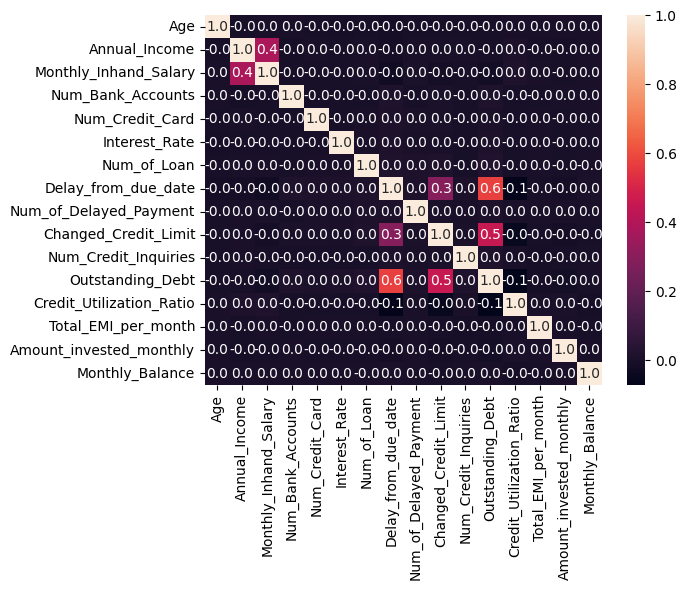

In [ ]:
sns.heatmap(df[numeric_columns].corr(),annot=True,fmt='.1f')
plt.show()

Insights:
* Monthly Inhand Salary is highly correlated with Annual Income
* Outstanding Debt is correlated with delay from due date and changed credit limit

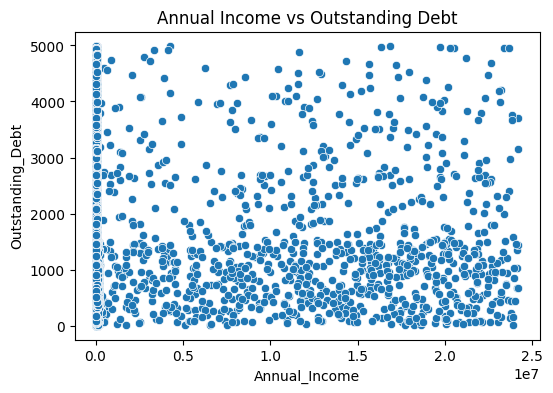

In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='Annual_Income', y='Outstanding_Debt', data=df)
plt.title('Annual Income vs Outstanding Debt')
plt.show()

There is no correlation between Annual Income and Outstanding Debt

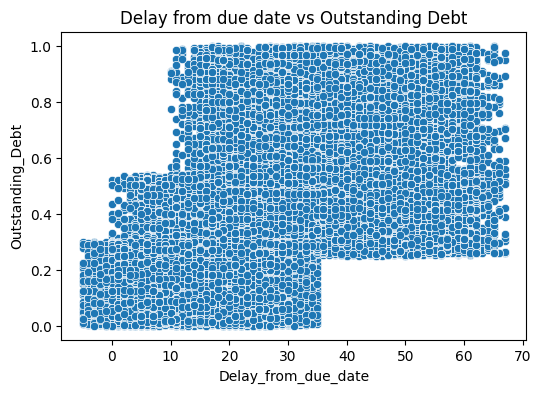

In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='Delay_from_due_date', y='Outstanding_Debt', data=df)
plt.title('Delay from due date vs Outstanding Debt')
plt.show()

There is a correlation between Delay from due date and Outstanding Debt

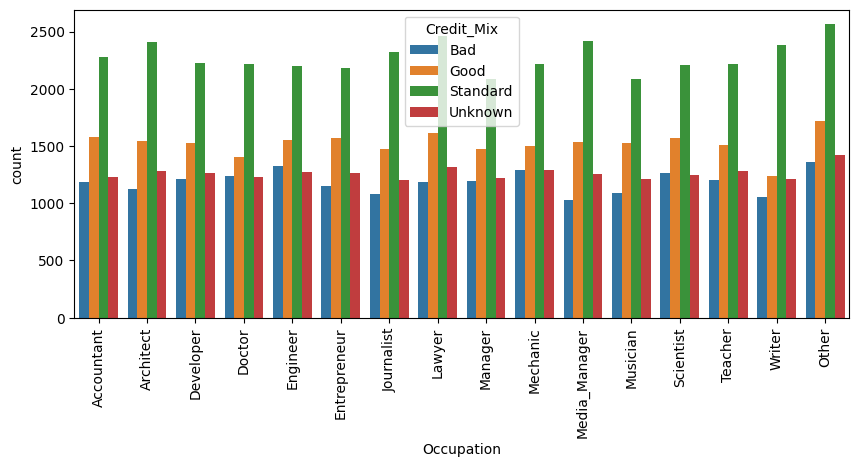

In [ ]:
plt.figure(figsize=(10,4))
sns.countplot(x='Occupation',data=df,hue='Credit_Mix')
plt.xticks(rotation=90)
plt.show()

Customers with "Unknown" occupation have the most standard or balanced credit mix, followed closely by customers in the "Lawyer" occupation category.

In [ ]:
df['Occupation'].value_counts()

,count
Occupation,
Other,7062
Lawyer,6575
Architect,6355
Engineer,6350
Scientist,6299
Mechanic,6291
Accountant,6271
Developer,6235
Media_Manager,6232


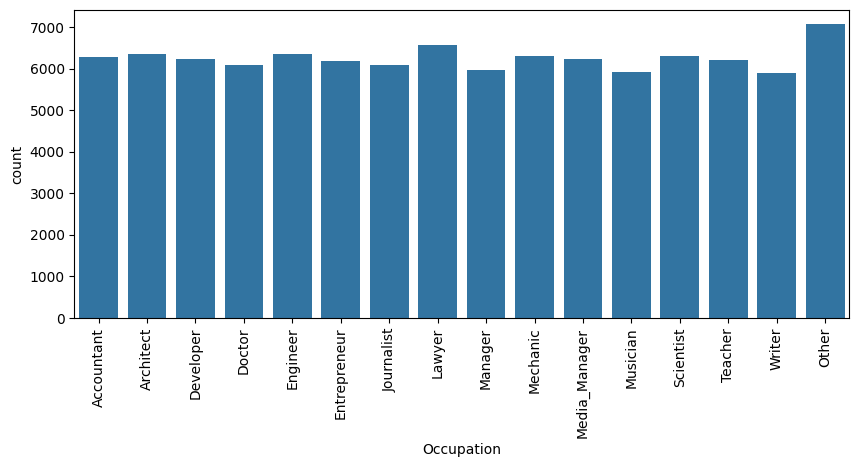

In [ ]:
plt.figure(figsize=(10,4))
sns.countplot(x='Occupation',data=df)
plt.xticks(rotation=90)
plt.show()

dataset contains a large number of entries with "Unknown" occupation (7062) and "Lawyer" occupation (6575)

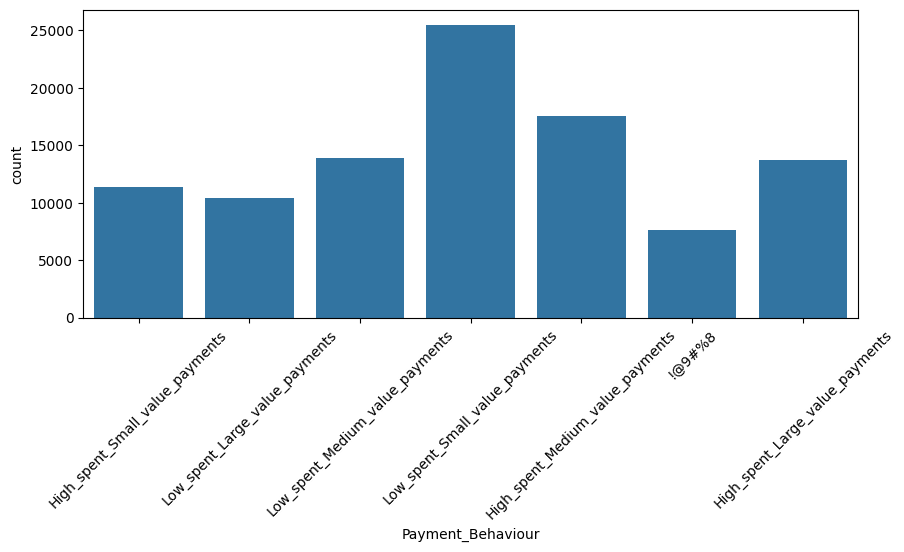

In [ ]:
plt.figure(figsize=(10,4))
sns.countplot(x='Payment_Behaviour',data=df)
plt.xticks(rotation=45)
plt.show()

Insights: Small-value payments with low spending impact payment behavior One important finding in the dataset is that consumers who frequently make small-value, low-spend payments have a big influence on how people pay overall. These clients regularly pay on time, which helps to foster good credit behavior.

High-Spend Medium-Value Payments Affect Payment Patterns as Well: Customers that make high-spending, medium-value payments are likewise a significant category, even if they do so less frequently than small-value payments. They frequently exhibit a responsible credit utilization and payback pattern. Their payment habit is often regular and modest, which serves to bolster their good creditworthiness.

Effect on Credit Score: Regular small-value payments show reliable payment practices, which lowers the risk of late payments. Conversely, clients paying for medium-value items, nonetheless

In [ ]:
df['Payment_Behaviour'].value_counts().head(6)

,count
Payment_Behaviour,
Low_spent_Small_value_payments,25513
High_spent_Medium_value_payments,17540
Low_spent_Medium_value_payments,13861
High_spent_Large_value_payments,13721
High_spent_Small_value_payments,11340
Low_spent_Large_value_payments,10425


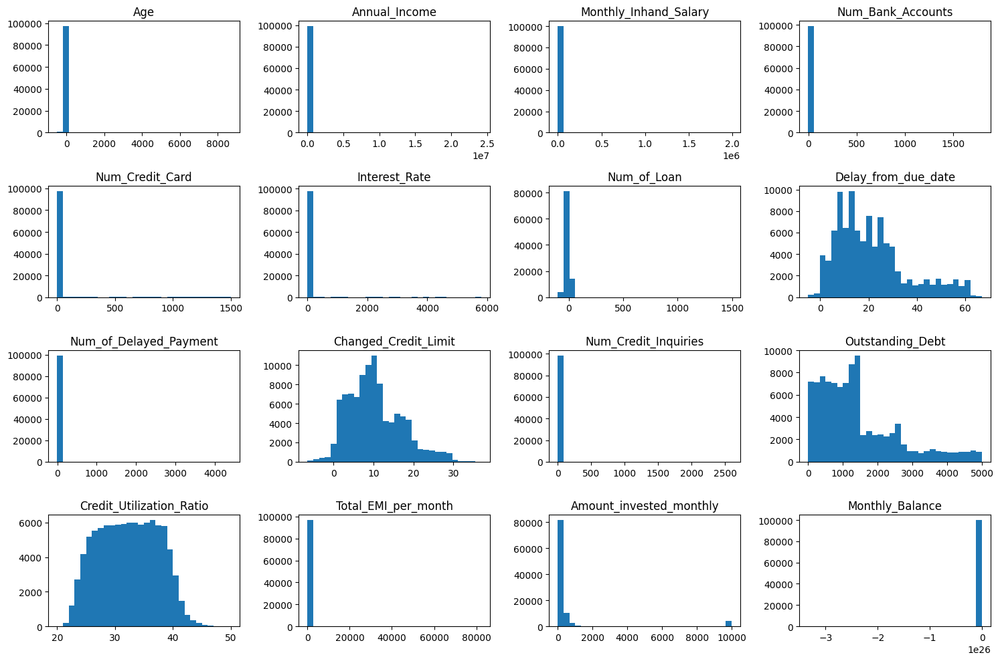

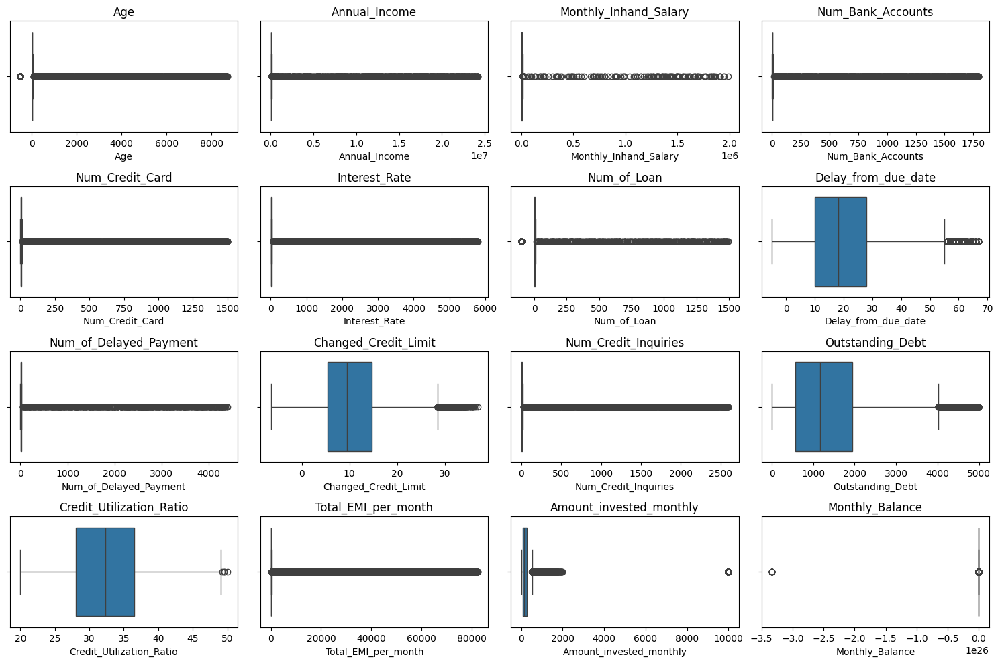

In [ ]:
# Histograms for numeric columns
numeric_columns = df.select_dtypes(include='number').columns

df[numeric_columns].hist(figsize=(15, 10), bins=30, grid=False)
plt.tight_layout()
plt.show()

# Box plots for outlier detection
plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=df[column])
    plt.title(column)
plt.tight_layout()
plt.show()

Credit Utilization Ratio Exhibits a Normal Distribution and Other Numerical Features Are Skewed.

# Feature Engineering:

In [ ]:
# This ratio measures the portion of a customer’s income used to pay debts. A lower value indicates good credit behavior.

df['Debt_to_Income_Ratio'] = df['Outstanding_Debt'] / df['Annual_Income']

In [ ]:
# This feature sums the EMI and monthly investment to reflect the total outgoing payments.

df['Avg_Monthly_Debt_Payments'] = df['Total_EMI_per_month'] + df['Amount_invested_monthly']

In [ ]:
# Frequent credit inquiries combined with high interest rates can be a sign of credit risk.

df['Credit_Inquiry_Impact'] = df['Num_Credit_Inquiries'] * df['Interest_Rate']

In [ ]:
# This measures how many loans a customer has compared to their income.

df['Loan_to_Income_Ratio'] = df['Num_of_Loan'] / df['Annual_Income']

In [ ]:
# Function to convert 'Years and Months' to total months
def convert_to_months(value):
    if value == 'Unknown':
        return np.nan  # Replace 'Unknown' with NaN
    else:
        # Split the value into years and months
        parts = value.split('and')
        years = int(parts[0].strip().split()[0])  # Extract years part
        months = int(parts[1].strip().split()[0])  # Extract months part
        total_months = years * 12 + months  # Convert to total months
        return total_months

# Apply the function to the 'Credit_History_Age' column
df['Credit_History_Age_Months'] = df['Credit_History_Age'].apply(convert_to_months)


In [ ]:
df['Credit_History_Age_Months'].isnull().sum()

9030

In [ ]:
df['Credit_History_Age_Months']=df['Credit_History_Age_Months'].fillna(df['Credit_History_Age_Months'].median())

In [ ]:
df['Credit_History_Age_Months'].isnull().sum()

0

## Standardizing the Features

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Select relevant columns for standardization
features_to_scale = ['Num_of_Delayed_Payment', 'Credit_Utilization_Ratio', 'Credit_History_Age_Months',
                     'Num_Credit_Inquiries', 'Outstanding_Debt', 'Annual_Income', 'Debt_to_Income_Ratio']

# Initialize scaler
scaler = MinMaxScaler()

# Apply scaling
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])


**Explanation of the Methodology**

**Payment History:** Delayed payments are a critical indicator of poor credit behavior. A customer with fewer delayed payments will receive a higher score.

**Credit Utilization Ratio:** High credit utilization suggests reliance on credit, which is risky. Keeping this ratio below 30% is considered good.

**Credit History Length:** A longer history demonstrates experience managing credit.

**Credit Inquiries:** Frequent credit inquiries can signal financial distress, so fewer inquiries lead to a higher score.

**Debt-to-Income Ratio:** A lower debt-to-income ratio means the customer can manage their debt better, improving the score.

In [ ]:
# Define weighting scheme
weights = {
    'Num_of_Delayed_Payment': 0.35,
    'Credit_Utilization_Ratio': 0.30,
    'Credit_History_Age_Months': 0.15,
    'Num_Credit_Inquiries': 0.05,
    'Debt_to_Income_Ratio': 0.05
}

# Calculate credit score
df['Credit_Score'] = (
    df['Num_of_Delayed_Payment'] * weights['Num_of_Delayed_Payment'] +
    df['Credit_Utilization_Ratio'] * weights['Credit_Utilization_Ratio'] +
    df['Credit_History_Age_Months'] * weights['Credit_History_Age_Months'] +
    df['Num_Credit_Inquiries'] * weights['Num_Credit_Inquiries'] +
    df['Debt_to_Income_Ratio'] * weights['Debt_to_Income_Ratio']
)

# Scale the credit score to a 300-850 range
df['Credit_Score'] = df['Credit_Score'] * (850 - 300) + 300


**Justification for the weightage allocation in the credit score calculation:**

**Num_of_Delayed_Payment (35%):**
This is one of the most significant factors because delayed payments are strong indicators of poor credit behavior. A higher number of delayed payments suggests difficulty in managing debts and is typically a red flag for lenders. Thus, it receives the highest weight, aligning with real-world credit scoring systems where payment history often has a large impact.

**Credit_Utilization_Ratio (30%):**
This ratio reflects how much of the available credit is being used. Higher credit utilization can indicate over-reliance on credit, which is a risk for lenders. A well-managed credit utilization (typically below 30%) suggests financial discipline, which is why it has a significant weight. It’s a crucial measure of how responsibly a customer handles their available credit.

**Credit_History_Age_Months (15%):**
The length of credit history is important because it shows how experienced the customer is with managing credit. A longer history typically suggests more reliability and stability. Although important, it receives a lower weight than payment history and utilization, as it doesn’t directly indicate current financial behavior.

**Num_Credit_Inquiries (5%):**
Credit inquiries can signal credit-seeking behavior. A high number of inquiries in a short period may indicate financial stress, but this alone doesn’t necessarily indicate poor credit behavior. Thus, it receives a lower weight since it’s more of a cautionary indicator rather than a decisive factor.

**Debt_to_Income_Ratio (5%):**
The debt-to-income ratio compares a customer's monthly debt payments to their monthly income. A lower ratio suggests better ability to manage debt. While important, it’s given a smaller weight since it’s often seen as a supplemental factor that provides context to other key metrics, such as payment history and credit utilization.

In [ ]:
df['Credit_Score'].unique()

array([393.75449389, 412.81674286, 403.99095137, ..., 495.4279587 ,
       454.0874448 , 456.99056013])

In [ ]:
# Step 1: Aggregate data by Customer_ID
customer_level_data = df.groupby('Customer_ID').agg({
    'Num_of_Delayed_Payment': 'sum',  # or 'mean', depending on how you want to aggregate
    'Credit_Utilization_Ratio': 'mean',
    'Credit_History_Age_Months': 'mean',
    'Num_Credit_Inquiries': 'sum',  # or 'mean'
    'Debt_to_Income_Ratio': 'mean'   # or another aggregation method
}).reset_index()

# Step 2: Define weighting scheme
weights = {
    'Num_of_Delayed_Payment': 0.35,
    'Credit_Utilization_Ratio': 0.30,
    'Credit_History_Age_Months': 0.15,
    'Num_Credit_Inquiries': 0.05,
    'Debt_to_Income_Ratio': 0.05
}

# Step 3: Calculate the credit score for each customer
customer_level_data['Credit_Score'] = (
    customer_level_data['Num_of_Delayed_Payment'] * weights['Num_of_Delayed_Payment'] +
    customer_level_data['Credit_Utilization_Ratio'] * weights['Credit_Utilization_Ratio'] +
    customer_level_data['Credit_History_Age_Months'] * weights['Credit_History_Age_Months'] +
    customer_level_data['Num_Credit_Inquiries'] * weights['Num_Credit_Inquiries'] +
    customer_level_data['Debt_to_Income_Ratio'] * weights['Debt_to_Income_Ratio']
)

# Step 4: Scale the credit score to a 300-850 range
# Assuming the unscaled scores range is normalized between 0 and 1 for calculation
customer_level_data['Credit_Score'] = (
    customer_level_data['Credit_Score'] * (850 - 300) + 300
)

# Display the final customer-level data with credit scores
print(customer_level_data[['Customer_ID', 'Credit_Score']])


      Customer_ID  Credit_Score
0      CUS_0x1000    412.388700
1      CUS_0x1009    508.987295
2      CUS_0x100b    448.679415
3      CUS_0x1011    407.812976
4      CUS_0x1013    413.730389
...           ...           ...
12495   CUS_0xff3    420.165701
12496   CUS_0xff4    421.261051
12497   CUS_0xff6    436.422762
12498   CUS_0xffc    424.316112
12499   CUS_0xffd    436.954438

[12500 rows x 2 columns]


In [ ]:
df['Month'].unique()

['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August']
Categories (8, object): ['April', 'August', 'February', 'January', 'July', 'June', 'March', 'May']

In [ ]:
data=df.copy()

In [ ]:
data['Month'] = data['Month'].astype(str)

In [ ]:
data['Month'] = pd.to_datetime(data['Month'] + ' 2020', format='%B %Y')

In [ ]:
data['Month'].unique()

<DatetimeArray>
['2020-01-01 00:00:00', '2020-02-01 00:00:00', '2020-03-01 00:00:00',
 '2020-04-01 00:00:00', '2020-05-01 00:00:00', '2020-06-01 00:00:00',
 '2020-07-01 00:00:00', '2020-08-01 00:00:00']
Length: 8, dtype: datetime64[ns]

In [ ]:

# Define a reference date
reference_date = pd.to_datetime('2020-08-01')

# Calculate the last 3 months and last 6 months
last_3_months_start = reference_date - pd.DateOffset(months=3)
last_6_months_start = reference_date - pd.DateOffset(months=6)

#Filter the DataFrame for last 3 months
last_3_months_data = data[(data['Month'] >= last_3_months_start) & (data['Month'] <= reference_date)]

# Filter the DataFrame for last 6 months
last_6_months_data = data[(data['Month'] >= last_6_months_start) & (data['Month'] <= reference_date)]


# Step 3: Aggregate the last 3 months data
last_3_months_agg = last_3_months_data.groupby('Customer_ID').agg({
    'Num_of_Delayed_Payment': 'sum',  # Or 'mean', depending on how you want to aggregate
    'Credit_Utilization_Ratio': 'mean',
    'Credit_History_Age_Months': 'mean',
    'Num_Credit_Inquiries': 'sum',  # Or 'mean'
    'Debt_to_Income_Ratio': 'mean'   # Or another aggregation method
}).reset_index()

# Calculate the Credit Score for last 3 months
last_3_months_agg['Credit_Score'] = (
    last_3_months_agg['Num_of_Delayed_Payment'] * weights['Num_of_Delayed_Payment'] +
    last_3_months_agg['Credit_Utilization_Ratio'] * weights['Credit_Utilization_Ratio'] +
    last_3_months_agg['Credit_History_Age_Months'] * weights['Credit_History_Age_Months'] +
    last_3_months_agg['Num_Credit_Inquiries'] * weights['Num_Credit_Inquiries'] +
    last_3_months_agg['Debt_to_Income_Ratio'] * weights['Debt_to_Income_Ratio']
)

# Scale the Credit Score to a 300-850 range for last 3 months
last_3_months_agg['Credit_Score_3M'] = (
    last_3_months_agg['Credit_Score'] * (850 - 300) + 300
)

# Step 4: Aggregate the last 6 months data
last_6_months_agg = last_6_months_data.groupby('Customer_ID').agg({
    'Num_of_Delayed_Payment': 'sum',
    'Credit_Utilization_Ratio': 'mean',
    'Credit_History_Age_Months': 'mean',
    'Num_Credit_Inquiries': 'sum',
    'Debt_to_Income_Ratio': 'mean'
}).reset_index()

# Calculate the Credit Score for last 6 months
last_6_months_agg['Credit_Score'] = (
    last_6_months_agg['Num_of_Delayed_Payment'] * weights['Num_of_Delayed_Payment'] +
    last_6_months_agg['Credit_Utilization_Ratio'] * weights['Credit_Utilization_Ratio'] +
    last_6_months_agg['Credit_History_Age_Months'] * weights['Credit_History_Age_Months'] +
    last_6_months_agg['Num_Credit_Inquiries'] * weights['Num_Credit_Inquiries'] +
    last_6_months_agg['Debt_to_Income_Ratio'] * weights['Debt_to_Income_Ratio']
)

# Scale the Credit Score to a 300-850 range for last 6 months
last_6_months_agg['Credit_Score_6M'] = (
    last_6_months_agg['Credit_Score'] * (850 - 300) + 300
)






In [ ]:
#Step 6: Combine results
# Merge the original DataFrame with the last 3 and last 6 months aggregated data
final_results = customer_level_data[['Customer_ID', 'Credit_Score']].drop_duplicates()
final_results = final_results.merge(
    last_3_months_agg[['Customer_ID', 'Credit_Score']],
    on='Customer_ID',
    suffixes=('', '_last_3_months'),
    how='left'
).rename(columns={'Credit_Score_last_3_months': 'Credit_Score_Last_3_Months'})

final_results = final_results.merge(
    last_6_months_agg[['Customer_ID', 'Credit_Score']],
    on='Customer_ID',
    suffixes=('', '_last_6_months'),
    how='left'
).rename(columns={'Credit_Score_last_6_months': 'Credit_Score_Last_6_Months'})


In [ ]:
final_results.head(5)

,Customer_ID,Credit_Score,Credit_Score_Last_3_Months,Credit_Score_Last_6_Months
0,CUS_0x1000,412.388700,0.212094,0.211917
1,CUS_0x1009,508.987295,0.282936,0.248571
2,CUS_0x100b,448.679415,0.198754,0.265420
3,CUS_0x1011,407.812976,0.189901,0.195085
4,CUS_0x1013,413.730389,0.215571,0.191743


In [ ]:
# Sort by original credit score in descending order and select the top 5 customers
top_5_customers_by_credit_score = final_results.sort_values(by='Credit_Score', ascending=False).head(5)

# Sort by recency-based credit score for the last 3 months and select the top 5 customers
top_5_customers_by_last_3_months = final_results.sort_values(by='Credit_Score_Last_3_Months', ascending=False).head(5)

# Sort by recency-based credit score for the last 6 months and select the top 5 customers
top_5_customers_by_last_6_months = final_results.sort_values(by='Credit_Score_Last_6_Months', ascending=False).head(5)

# Display the results
print("Top 5 Customers by Original Credit Score:")
print(top_5_customers_by_credit_score[['Customer_ID', 'Credit_Score']])

print("\nTop 5 Customers by Credit Score (Last 3 Months):")
print(top_5_customers_by_last_3_months[['Customer_ID', 'Credit_Score_Last_3_Months']])

print("\nTop 5 Customers by Credit Score (Last 6 Months):")
print(top_5_customers_by_last_6_months[['Customer_ID', 'Credit_Score_Last_6_Months']])


Top 5 Customers by Original Credit Score:
     Customer_ID  Credit_Score
1795  CUS_0x2c60    771.019115
6889  CUS_0x7755    749.730082
5191  CUS_0x5e84    746.997485
7534  CUS_0x80fd    732.436785
3274  CUS_0x4314    716.520887

Top 5 Customers by Credit Score (Last 3 Months):
      Customer_ID  Credit_Score_Last_3_Months
3274   CUS_0x4314                    0.760554
7534   CUS_0x80fd                    0.737873
2509   CUS_0x37be                    0.625469
11190  CUS_0xb6e0                    0.621415
4155   CUS_0x4f15                    0.620414

Top 5 Customers by Credit Score (Last 6 Months):
     Customer_ID  Credit_Score_Last_6_Months
5191  CUS_0x5e84                    0.804387
7534  CUS_0x80fd                    0.791502
3274  CUS_0x4314                    0.755245
990   CUS_0x205a                    0.696073
2856  CUS_0x3d40                    0.629621


**Insights:**

* Dataset contains 100000 rows and 27 columns

* Age Distribution: The average age is unexpectedly high (110.65), and the standard deviation (686.24).

* Annual Income: The mean annual income is 176,415.70 USD, but the high standard deviation (1.42 million) indicates significant variability in income levels.

* Monthly In-hand Salary: The average in-hand salary is 5,743.26 USD, but the standard deviation of 45,814.69 USD shows a large variation.

* Number of Bank Accounts: The average number of bank accounts is 17.09, with a standard deviation of 117.40.

* Number of Credit Cards: The average number of credit cards is 22.47, with a wide range (maximum of 1,499).

* Interest Rate: The mean interest rate is 72.47%, with a very high standard deviation (466.42%).

* Delayed Payments: The average number of delayed payments is 29.74, with significant variability (standard deviation of 218). The maximum of 4,397 delayed payments suggests the presence of extreme cases.

* Changed Credit Limit: On average, the credit limit was changed by 10.39 units, with the maximum change being 36.97. Negative values (minimum -6.49) could indicate reductions in credit limits.

* Credit Inquiries: The average number of credit inquiries is 27.33, with a maximum of 2,597. The high standard deviation suggests that some individuals have a significantly higher number of inquiries.

* Outstanding Debt: The mean outstanding debt is 1,426.22 USD, with a fairly high standard deviation ( 1,155.13).

* Credit Utilization Ratio: The average credit utilization ratio is 32.29%, which falls within the typical 30-40% range for responsible credit usage.

* Total EMI per Month: The average EMI per month is 1,403.12 USD, with a maximum of $82,331, suggesting significant variation in the amount of debt repayments.

* Monthly Inhand Salary is highly correlated with Annual Income

* Outstanding Debt is correlated with delay from due date and changed credit limit

* Small-value payments with low spending impact payment behavior One important finding in the dataset is that consumers who frequently make small-value, low-spend payments have a big influence on how people pay overall. These clients regularly pay on time, which helps to foster good credit behavior.

* High-Spend Medium-Value Payments Affect Payment Patterns as Well: Customers that make high-spending, medium-value payments are likewise a significant category, even if they do so less frequently than small-value payments. They frequently exhibit a responsible credit utilization and payback pattern. Their payment habit is often regular and modest, which serves to bolster their good creditworthiness.

* Customers with "Unknown" occupation have the most standard or balanced credit mix, followed closely by customers in the "Lawyer" occupation category.

**Recommendations:**

* Encourage consumers to make frequent, small-value payments by promoting services or products with small recurring fees.

* Offer targeted incentives or rewards for timely payments, especially for small-to-medium transactions, as these contribute to overall credit health.

* Investigate why certain individuals have an unusually high number of inquiries, which may indicate fraud or reporting issues.

* Educate customers on maintaining a credit utilization ratio below 30% to improve their creditworthiness.

* Provide personalized payment schedules or financial management tools to help customers balance spending and debt repayments.

* Offer debt consolidation or financial counseling services to customers with a high correlation between outstanding debt and delayed payments to help improve their financial health.